In [1]:
!pip install pandas numpy matplotlib prophet scikit-learn plotly seaborn

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from prophet import Prophet

In [3]:
import os

path = './input/'

# Get a list of all files in the 'input' directory
files = os.listdir(path)

# Print the list of files
for file in files:
    print(file)

SURFACE_ASOS_108_DAY_1997_1997_2018.csv
SURFACE_ASOS_108_DAY_1998_1998_2018.csv
SURFACE_ASOS_108_DAY_1999_1999_2018.csv
SURFACE_ASOS_108_DAY_2000_2000_2018.csv
SURFACE_ASOS_108_DAY_2001_2001_2018.csv
SURFACE_ASOS_108_DAY_2002_2002_2018.csv
SURFACE_ASOS_108_DAY_2003_2003_2018.csv
SURFACE_ASOS_108_DAY_2004_2004_2018.csv
SURFACE_ASOS_108_DAY_2005_2005_2018.csv
SURFACE_ASOS_108_DAY_2006_2006_2018.csv
SURFACE_ASOS_108_DAY_2007_2007_2018.csv
SURFACE_ASOS_108_DAY_2008_2008_2018.csv
SURFACE_ASOS_108_DAY_2009_2009_2018.csv
SURFACE_ASOS_108_DAY_2010_2010_2015.csv
SURFACE_ASOS_108_DAY_2011_2011_2015.csv
SURFACE_ASOS_108_DAY_2012_2012_2015.csv
SURFACE_ASOS_108_DAY_2013_2013_2015.csv
SURFACE_ASOS_108_DAY_2014_2014_2015.csv
SURFACE_ASOS_108_DAY_2015_2015_2016.csv
SURFACE_ASOS_108_DAY_2016_2016_2017.csv
SURFACE_ASOS_108_DAY_2017_2017_2018.csv
SURFACE_ASOS_108_DAY_2018_2018_2019.csv
SURFACE_ASOS_108_DAY_2019_2019_2020.csv
SURFACE_ASOS_108_DAY_2020_2020_2021.csv
SURFACE_ASOS_108_DAY_2021_2021_2022.csv


In [4]:
# Initialize an empty list to store the dataframes
df_list = []

# Loop over the years 1997 to 2024
for file in files:
    # Read the CSV file for the current year
    df = pd.read_csv(path + file, encoding='CP949')

    # Select and rename columns
    df = df[['일시', '평균기온(°C)']].rename(columns={'일시': 'date', '평균기온(°C)': 'temperature'})

    # Convert 'date' to datetime format and extract year, month, and day
    df['date'] = pd.to_datetime(df['date'])
    df['year'] = df['date'].dt.year
    df['month'] = df['date'].dt.month
    df['day'] = df['date'].dt.day

    # Select the final columns and append the dataframe to the list
    df = df[['date', 'year', 'month', 'day', 'temperature']]
    df_list.append(df)

# Concatenate all the dataframes in the list into a single dataframe
df = pd.concat(df_list, ignore_index=True)
df

,date,year,month,day,temperature
0,1997-01-01,1997,1,1,-1.2
1,1997-01-02,1997,1,2,-8.4
2,1997-01-03,1997,1,3,-6.8
3,1997-01-04,1997,1,4,-4.6
4,1997-01-05,1997,1,5,-2.2
...,...,...,...,...,...
9856,2023-12-27,2023,12,27,1.5
9857,2023-12-28,2023,12,28,1.2
9858,2023-12-29,2023,12,29,1.3
9859,2023-12-30,2023,12,30,0.6


In [5]:
from sklearn.linear_model import LinearRegression  #선형 회귀 분석
import numpy as np
import matplotlib.pyplot as plt  #그래프 그리기

train_year = (df["year"] <= 2022)
test_year = (df["year"] >= 2023)  #1년치

interval = 3  #3의 배수만큼 반복


def make_data(data):
    x = []
    y = []
    temps = list(data["temperature"])
    #print(len(temps))  #3287, 363
    for i in range(len(temps)):
        if i <= interval: continue  #1,2,3
        y.append(temps[i])  #4부터 y리스트에 추가됨
        xa = []
        for p in range(interval):
            d = i + p - interval  #i=4 + p=0 - 3 -> 1        /  4+1-3 -> 2   / 4+2-3 -> 3
            xa.append(temps[d])  #위에서 나온 1이 추가됨 , 2, 3 추가됨 (본인 날짜 기준 이전 3개)
        x.append(xa)
    return (x, y)


train_x, train_y = make_data(df[train_year])
test_x, test_y = make_data(df[test_year])

In [6]:
#학습하기
lr = LinearRegression()
lr.fit(train_x, train_y)  #학습하기
pre_y = lr.predict(test_x)  #예측하기(실제값 넣음)

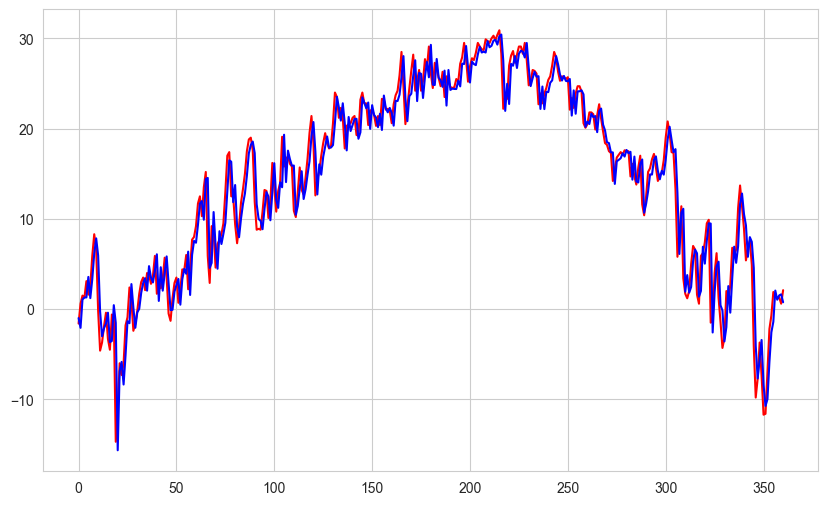

In [7]:
#결과를 그래프로 그리기
plt.figure(figsize=(10, 6), dpi=100)
plt.plot(test_y, c='r')  #red
plt.plot(pre_y, c='b')  #blue
plt.show()

In [8]:
# Split the data into training and test sets based on the year
df_train = df[df['year'] <= 2022][['date', 'temperature']].rename(
        columns={'date': 'ds', 'temperature': 'y'}).reset_index(drop=True)
df_test = df[df['year'] >= 2023][['date', 'temperature']].rename(
        columns={'date': 'ds', 'temperature': 'y'}).reset_index(drop=True)

df_test.tail()

,ds,y
360,2023-12-27,1.5
361,2023-12-28,1.2
362,2023-12-29,1.3
363,2023-12-30,0.6
364,2023-12-31,2.1


In [9]:
# Initialize the Prophet model for temperature forecasting
model = Prophet(yearly_seasonality=True, weekly_seasonality=False, daily_seasonality=False)

# Fit the model with the training data
model.fit(df_train)

12:01:52 - cmdstanpy - INFO - Chain [1] start processing
12:01:54 - cmdstanpy - INFO - Chain [1] done processing


In [10]:
# Make predictions for the test set
future = model.make_future_dataframe(periods=len(df_test), freq='D')

forecast = model.predict(future)

In [11]:
from prophet.plot import plot_plotly

# 전체 예측 시각화
try:
    plot_plotly(model, forecast).show()
except Exception:
    model.plot(forecast)

In [12]:
from prophet.plot import plot_components_plotly

# 성분별(트렌드, 계절성 등) 시각화
try:
    plot_components_plotly(model, forecast).show()
except Exception:
    model.plot_components(forecast)

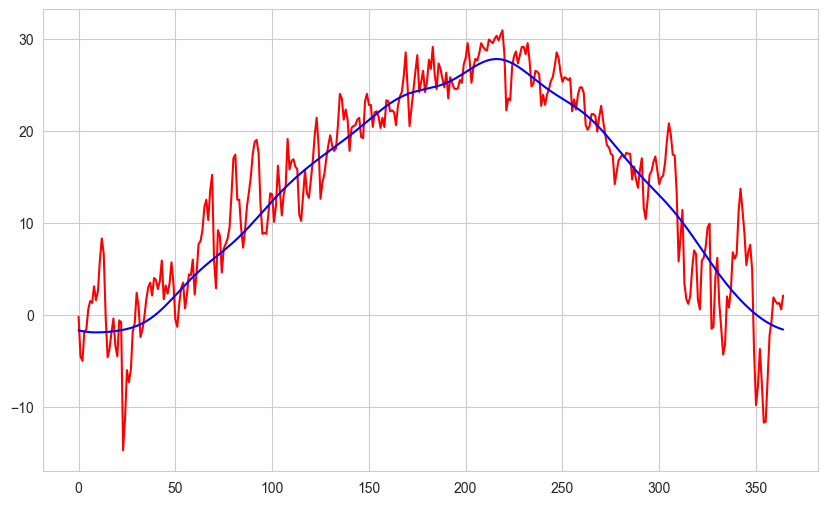

In [13]:
# Plot the forecast with test data
plt.figure(figsize=(10, 6), dpi=100)
plt.plot(df_test['y'].reset_index(drop=True), c='r')
plt.plot(forecast['yhat'][-len(df_test):].reset_index(drop=True), c='b')
plt.show()

In [14]:
from scipy.stats import pearsonr

# Calculate the Pearson correlation coefficient and the p-value
r, p = pearsonr(df_test['y'], forecast['yhat'][-len(df_test):])

print(f'Pearson correlation: {r}')
print(f'p-value: {p}')

Pearson correlation: 0.9420865062315986
p-value: 2.586540313655767e-174


In [15]:
from sklearn.metrics import mean_squared_error

# Calculate the mean squared error
mse = mean_squared_error(df_test['y'], forecast['yhat'][-len(df_test):])

# Print the mean squared error
print('Mean Squared Error:', mse)


Mean Squared Error: 12.964290458398915


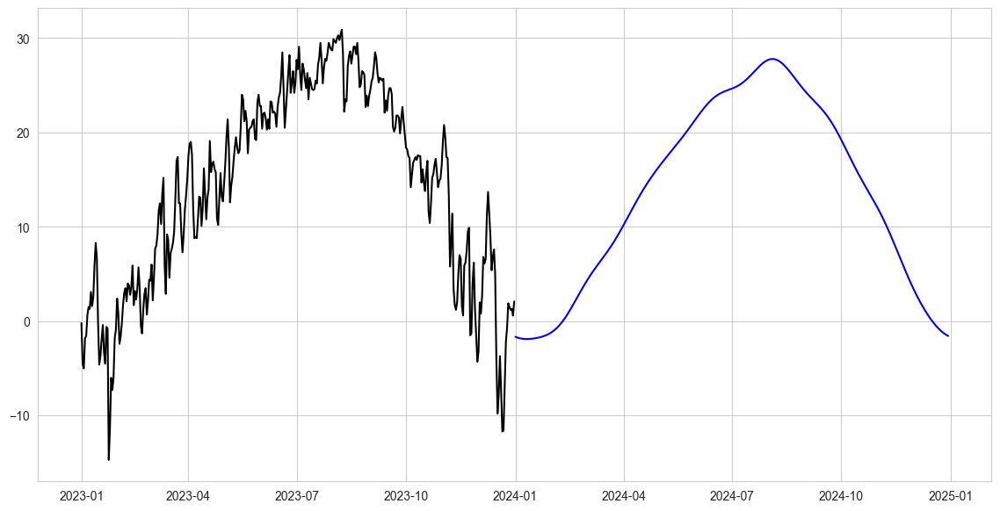

In [16]:
future = model.make_future_dataframe(periods=365*2)
forecast = model.predict(future)

plt.figure(figsize=(14, 7))
plt.plot(df_test['ds'], df_test['y'], label='Test Data', color='black')
plt.plot(forecast['ds'][forecast['ds'].dt.year >= 2024], forecast['yhat'][forecast['ds'].dt.year  >= 2024], label='Forecast', color='blue')
plt.show()

In [17]:
# 실제 데이터의 최고기온과 최저기온을 년도별로 계산합니다.
actual_max = df.groupby('year')['temperature'].max().reset_index()
actual_min = df.groupby('year')['temperature'].min().reset_index()

actual_max_mean = sum(actual_max['temperature']) / len(actual_max)
actual_min_mean = sum(actual_min['temperature']) / len(actual_min)

period_years = 50
future = model.make_future_dataframe(periods=365 * period_years, freq='D')
forecast = model.predict(future)

# 예측 데이터의 최고기온과 최저기온을 년도별로 계산합니다.
forecast['year'] = pd.DatetimeIndex(forecast['ds']).year
future_max = forecast.groupby('year')['yhat'].max().reset_index().rename(columns={'yhat': 'temperature'})
future_min = forecast.groupby('year')['yhat'].min().reset_index().rename(columns={'yhat': 'temperature'})

year_max = pd.concat([actual_max[:-1], future_max[-period_years:]], ignore_index=True)
year_min = pd.concat([actual_min[:-1], future_min[-period_years:]], ignore_index=True)

diff_year_max = pd.DataFrame(
        {'year': year_max['year'], 'temperature_diff': year_max['temperature'] - actual_max_mean})
diff_year_min = pd.DataFrame(
        {'year': year_min['year'], 'temperature_diff': year_min['temperature'] - actual_min_mean})

diff_year_max

,year,temperature_diff
0,1997,0.211111
1,1998,-2.488889
2,1999,-0.288889
3,2000,-1.088889
4,2001,-0.188889
...,...,...
71,2068,-1.810126
72,2069,-1.797977
73,2070,-1.783588
74,2071,-1.769635


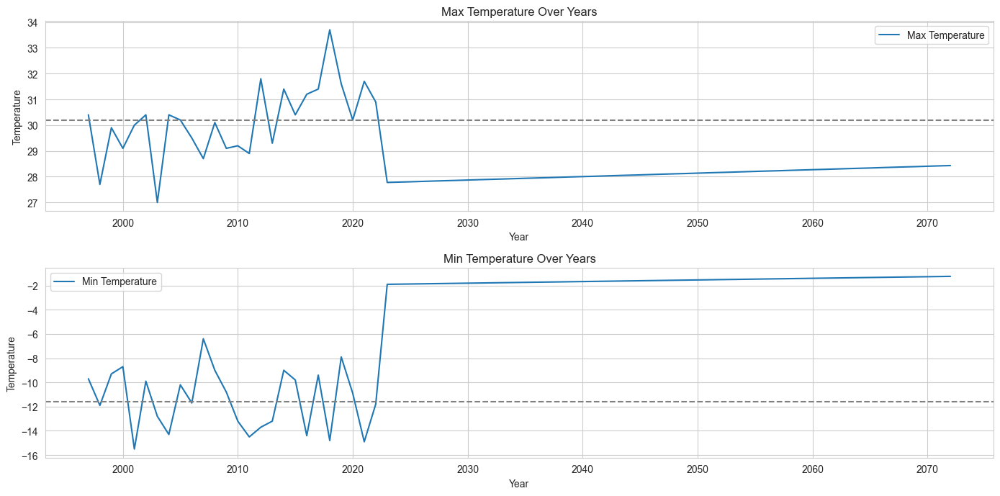

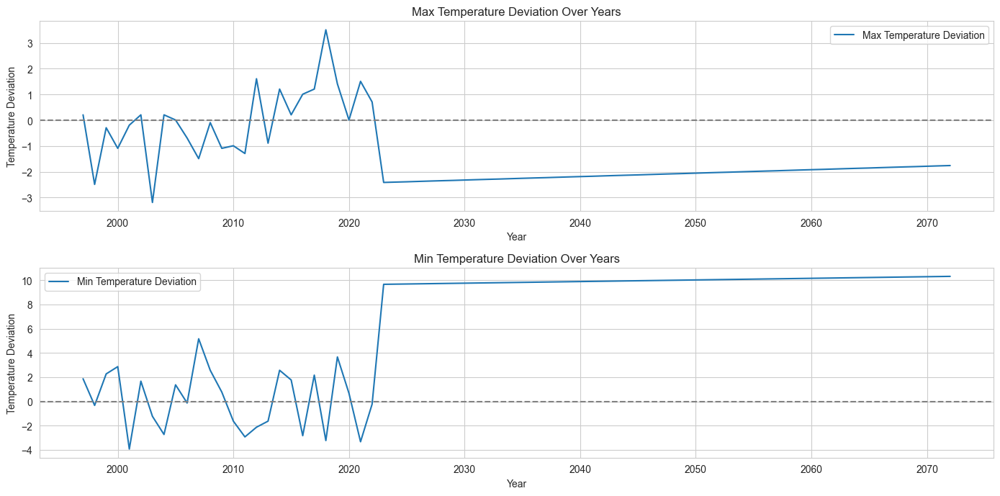

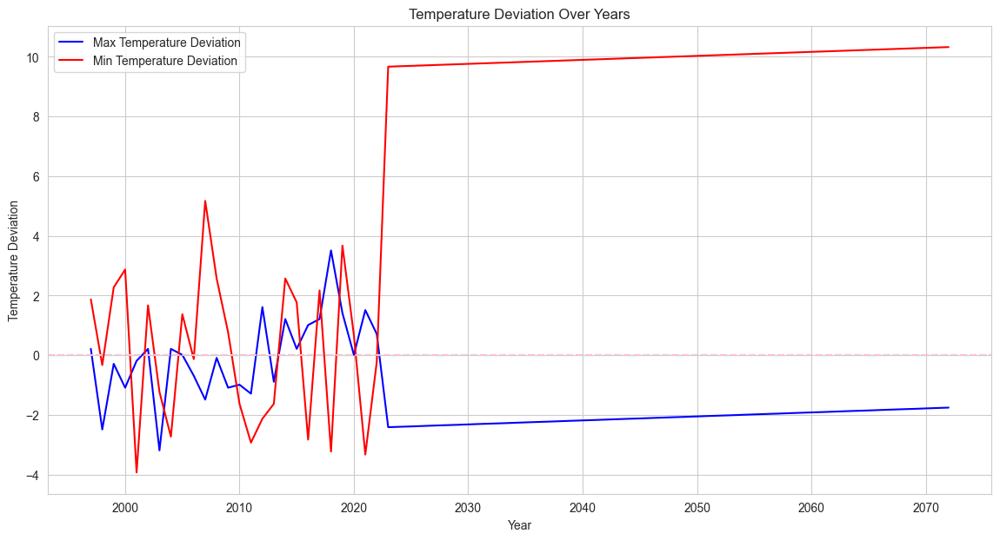

In [18]:
# 시각화

# 최고기온 그래프
plt.figure(figsize=(14, 7))

plt.subplot(2, 1, 1)
sns.lineplot(data=year_max, x='year', y='temperature',
             label='Max Temperature', errorbar=None)
plt.axhline(actual_max_mean, color='gray', linestyle='--')
plt.title('Max Temperature Over Years')
plt.xlabel('Year')
plt.ylabel('Temperature')
plt.legend()

# 최저기온 그래프
plt.subplot(2, 1, 2)
sns.lineplot(data=year_min, x='year', y='temperature',
             label='Min Temperature', errorbar=None)
plt.axhline(actual_min_mean, color='gray', linestyle='--')
plt.title('Min Temperature Over Years')
plt.xlabel('Year')
plt.ylabel('Temperature')
plt.legend()

plt.tight_layout()
plt.show()

# 최고기온 편차 그래프
plt.figure(figsize=(14, 7))

plt.subplot(2, 1, 1)
sns.lineplot(data=diff_year_max, x='year', y='temperature_diff', label='Max Temperature Deviation', errorbar=None)
plt.axhline(0, color='gray', linestyle='--')
plt.title('Max Temperature Deviation Over Years')
plt.xlabel('Year')
plt.ylabel('Temperature Deviation')
plt.legend()

# 최저기온 편차 그래프
plt.subplot(2, 1, 2)
sns.lineplot(data=diff_year_min, x='year', y='temperature_diff', label='Min Temperature Deviation', errorbar=None)
plt.axhline(0, color='gray', linestyle='--')
plt.title('Min Temperature Deviation Over Years')
plt.xlabel('Year')
plt.ylabel('Temperature Deviation')
plt.legend()

plt.tight_layout()
plt.show()

# 최고기온, 최저기온 편차 그래프
plt.figure(figsize=(14, 7))

sns.lineplot(data=diff_year_max, x='year', y='temperature_diff', label='Max Temperature Deviation', errorbar=None,
             color='blue')
plt.axhline(0, color='cyan', linestyle='--')
sns.lineplot(data=diff_year_min, x='year', y='temperature_diff', label='Min Temperature Deviation', errorbar=None,
             color='red')
plt.axhline(0, color='pink', linestyle='--')

plt.title('Temperature Deviation Over Years')
plt.xlabel('Year')
plt.ylabel('Temperature Deviation')
plt.legend()
plt.show()
